<a href="https://colab.research.google.com/github/mahelalakshang/Album/blob/master/dog_vision1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## End to end multi class image classification

###### 1.Problem
 Identifying breed of a dog given an image.
 When I am sitting at cafe and I take a photo of a dog . I want to know what is his breed
###### 2.Data
 The data w're using kaggle's dog breed identification competition

###### 3.Evaluation
 The Evaluation is a file with prediction probabilities  for each dog breed of each test image
 https://www.kaggle.com/c/dog-breed-identification/overview

 ###### 3.Features
  some info about the data:
  * We're dealing with images (unstructured)
  * so it is probably good deep learning/transfer learning.
  * there are 120 breeds of dogs(this means there are 120 diferent classes)
  * there are 10,000 test images and 10,000 train images
  * Images have no labels, because we'll want to predict them).

In [ ]:
# Unzip the uploaded data into Google drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"



```
# This is formatted as code
```

### Get our workspace ready

In [ ]:
#Import tensorflow
import tensorflow as tf
print("TF Version",tf.__version__)


TF Version 2.15.0


### Make sure use GPU

In [ ]:
#Import necessory tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version",tf.__version__)
print("TF Hub Version", hub.__version__)

#Check for GPU availability
print("GPU","available(YESSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available")



TF version 2.15.0
TF Hub Version 0.16.1
GPU available(YESSS!!!!!)


## Getting out data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first.
Turn our images into tensors(numerical format)

In [ ]:
# Accessing lables
import pandas as pd
lables_csv=pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(lables_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
lables_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many Images are there of each breed?
lables_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

<Axes: xlabel='breed'>

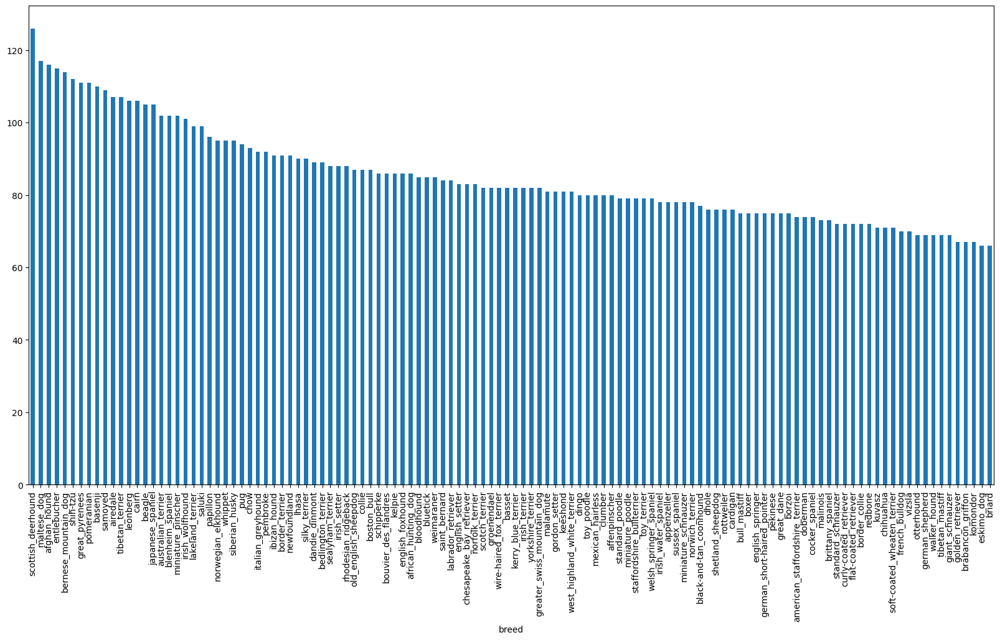

In [ ]:
lables_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
lables_csv["breed"].value_counts().median()

82.0

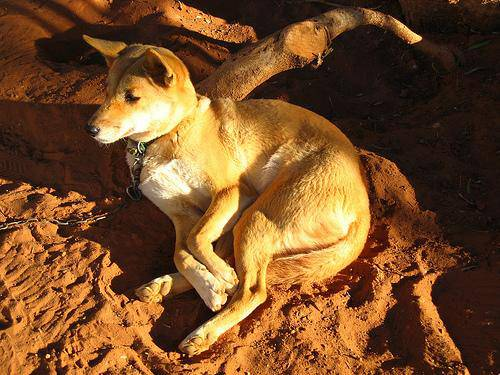

In [ ]:
# lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and there lables(like hot encoding)

In [ ]:
lables_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# create pathnames from Image ids
filenames=["drive/MyDrive/Dog Vision/train/"+fname+".jpg" for fname in lables_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#checks weather no of filename matches actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/"))==len(filenames):
  print("Filename matches actual image files length")
else:
  print("Not match")


Filename matches actual image files length


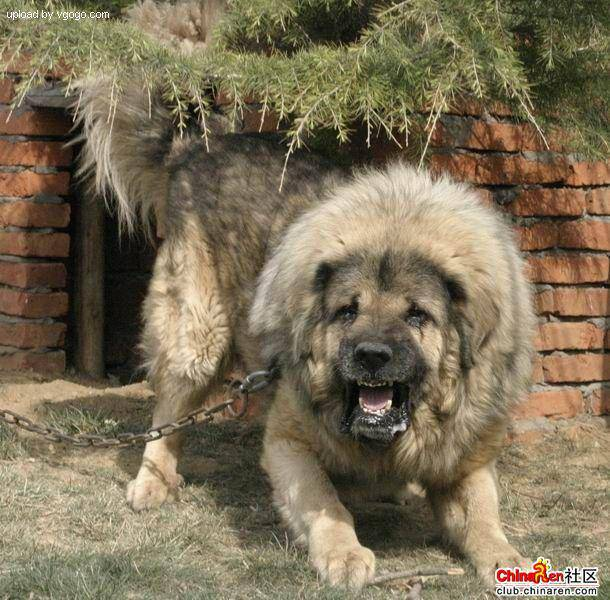

In [ ]:
Image(filenames[9000])

In [ ]:
lables_csv["breed"][9000]

'tibetan_mastiff'

Lets prepare our lables

In [ ]:
lables=lables_csv["breed"]
lables

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
import numpy as np
lables=np.array(lables)
lables

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(lables)

10222

In [ ]:
# see if numof labels matches the no of filenames
if len(lables)==len(filenames):
  print("Matches")
else:
  print("Not match")

Matches


In [ ]:
# Find the unique label values
unique_breeds=np.unique(lables)
unique_breeds


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(lables[0])
lables[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_lables=[label==unique_breeds for label in lables]
boolean_lables

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_lables)

10222

In [ ]:
#Example turning boolean array into integers
print(lables[0]) #original label
print(np.where(unique_breeds==lables[0])) #index where label occur
print(boolean_lables[0].argmax()) #index where label occurs in boolean array
print(boolean_lables[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(boolean_lables[2].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[2]

'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg'

### Creating our own validation set

In [ ]:
# Setup X & y variables
X=filenames
y=boolean_lables

In [ ]:
len(X), len(y)

(10222, 10222)

We are going to start of experimant with 1000 images and increase as needed

In [ ]:
# Set no of images for experimenting
#slider for show slider in right(Magic function)

In [ ]:
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
NUM_IMAGES

1000

In [ ]:
#Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split
np.random.seed(42)
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

In [ ]:
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
# lets have a geez(see) at the training data
X_train[:2],y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

### Preprocessing Images into tensors
1. Take an image file path as an Input
2. Use Tensorflow to read the file and save it to a variable 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize image(convert colour channel 0-255 to 0-1)
5. Resize the 'image' to be a shape of(224,244)
6. Return modified 'image'


In [ ]:
# before we do lets see image after, Convert image to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
#(height, width, colour chanel(RGB))

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
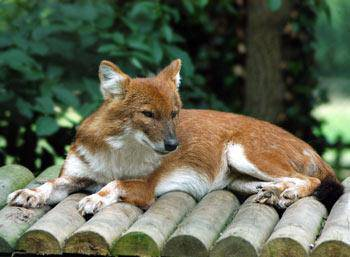

In [ ]:
image #click show data

In [ ]:
image.min(),image.max() #RGB pixel values between 0 to 255

(0, 255)

In [ ]:
# create tensor of the image
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

### Write function to
1. Take an image file path as an Input
2. Use Tensorflow to read the file and save it to a variable 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize image(convert colour channel 0-255 to 0-1)
5. Resize the 'image' to be a shape of(224,244)
6. Return modified 'image'

In [ ]:
IMG_SIZE=224 # resize shape

# create func for pre processing image

def process_image(image_path,img_size=IMG_SIZE):

  #Read an image
  image=tf.io.read_file(image_path)
  #Turn jpeg image into numerical Tensor with 3 colour channels(Red , green, blue)
  image=tf.image.decode_jpeg(image,channels=3)
  #convert the colour channel values from 0-255 to 0-1 values (called normalisation)
  image=tf.image.convert_image_dtype(image,tf.float32)
  #resize image (244,244)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

In [ ]:
print(process_image(filenames[42]),244)

tf.Tensor(
[[[0.3264178  0.5222886  0.3232816 ]
  [0.2537167  0.44366494 0.24117757]
  [0.25699762 0.4467087  0.23893751]
  ...
  [0.29325107 0.5189916  0.3215547 ]
  [0.29721776 0.52466875 0.33030328]
  [0.2948505  0.5223015  0.33406618]]

 [[0.25903144 0.4537807  0.27294815]
  [0.24375686 0.4407019  0.2554778 ]
  [0.2838985  0.47213382 0.28298813]
  ...
  [0.2785345  0.5027992  0.31004712]
  [0.28428748 0.5108719  0.32523635]
  [0.28821915 0.5148036  0.32916805]]

 [[0.20941195 0.40692952 0.25792548]
  [0.24045378 0.43900946 0.2868911 ]
  [0.29001117 0.47937486 0.32247734]
  ...
  [0.26074055 0.48414773 0.30125174]
  [0.27101526 0.49454468 0.32096273]
  [0.27939945 0.5029289  0.32934693]]

 ...

 [[0.00634795 0.03442048 0.0258106 ]
  [0.01408936 0.04459917 0.0301715 ]
  [0.01385712 0.04856448 0.02839671]
  ...
  [0.4220516  0.39761978 0.21622123]
  [0.47932503 0.45370543 0.2696505 ]
  [0.48181024 0.45828083 0.27004552]]

 [[0.00222061 0.02262166 0.03176915]
  [0.01008397 0.03669046 0

### turning our data into batches

* Why turn our data into batches(32 images per batch is good).
Think we're trying to process 10,000 + images in one go.. they all
might not fit into memory

* In order to use Tensorflow effectively, we need our data in the form of tensor tupples which look like this `(image,label)`.


In [ ]:
# Create simple function to return a tupple (image,label)

In [ ]:
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label

In [ ]:
#Demo of above
(process_image(X[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# turn lables to tensor
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
#Turn All data to batches(tuples of tensors) of 32, X and y (image,label)


In [ ]:
# Define batch size
BATCH_SIZE=32
# Create function turn data into batches(training ,validation, test batches)
# and shuffle data if it is training data
# doesn't shuffle validation data
# accept test data as input (no lables)

def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  #IF data is test data set, we probably don't have lables
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices(tf.constant(X)) # this function tell, pass me some tensors. I will create data set out of that
    data_batch=data.map(process_image).batch(BATCH_SIZE) # we can use process_image function here because no lables here #tf.constant(X) is param to process_image func
    return data_batch
  #IF data is a validate set, we no need to shuffle
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    #Shuffle pathname and lables before mapping
    data=data.shuffle(buffer_size=len(X))# Get file data(name and lables) and shuffle it up len(X)
    # mean shuffle them all if we add len(10) it only shuffle first 10
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch




In [ ]:
#Create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
#Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
#Above none mean batch size, it always show like that
#Above we have (image, lable) tuple label 120 mean diamention
#244, 244, 3 mean height weight and rgb colour chanel


### Visualizing Data Batches

* Now Our data is with batches , lets visualize

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images,lables):
  #display 25 images and their lables from a data batches
  plt.figure(figsize=(10,10))
  #loop through 25 images
  for i in range(25):
    #Create subplots (5 rows, 5 columns)
    ax=plt.subplot(5,5,i+1) # rows , colomns, index
    #Display an Image
    plt.imshow(images[i])
    #Add image label as title
    plt.title(unique_breeds[lables[i].argmax()])
    #Turn the grid lines off
    #plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

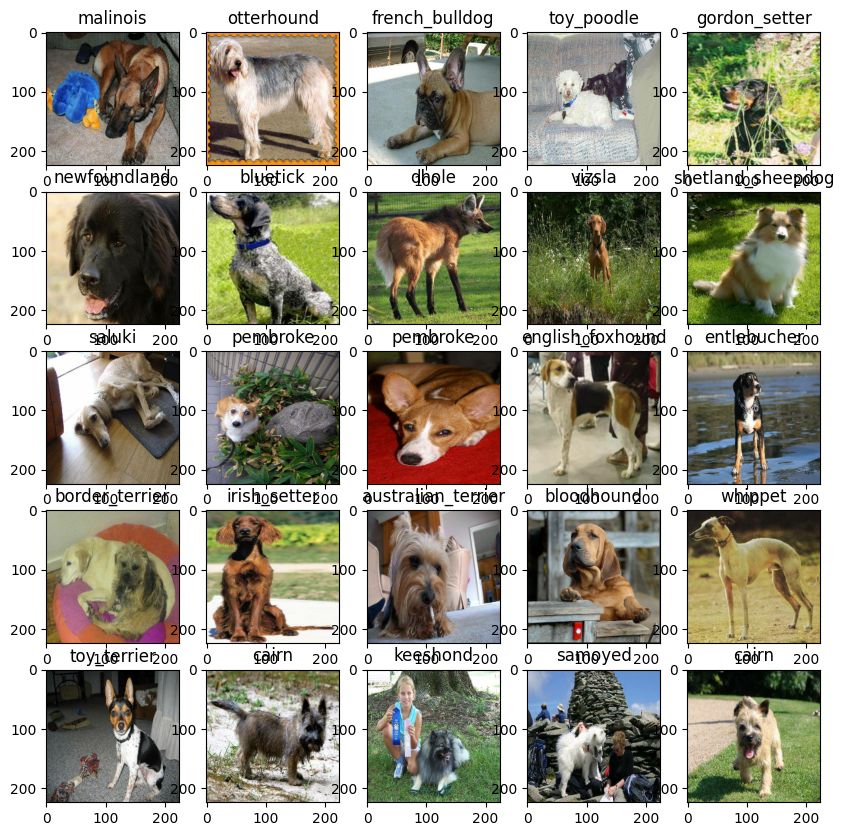

In [ ]:
train_images,train_lables=next(train_data.as_numpy_iterator()) #get one batch
len(train_images),len(train_lables)
#Now lets visualize the data in a training batch
show_25_images(train_images,train_lables) # when we run this code, this dogs list alwas diferent, because we always shuffle validation set

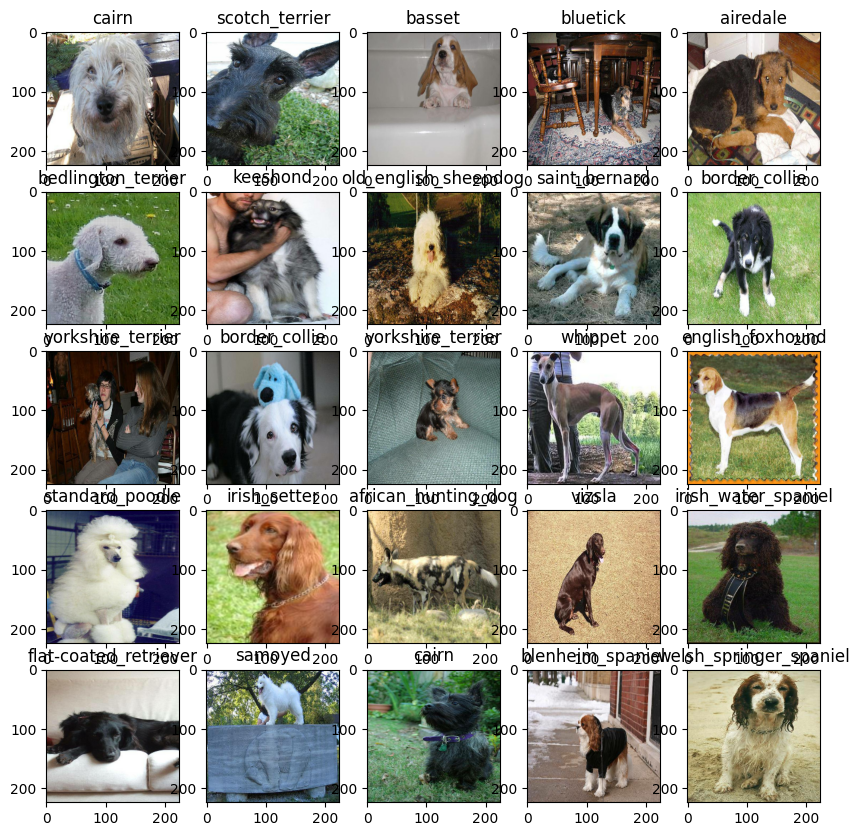

In [ ]:
#Now visualize validation set
val_images,val_lables=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_lables)

### Building model

Before we build model, there are few things we need to define:
* The input(images) and output(lables) is form of tensors
* Url of the model we want to use

In [ ]:
# Setup input shape to the model
INPUT_SHAPE=[None, IMG_SIZE,IMG_SIZE,3] #batch,height,width,colour channel

# Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds) #120

# Setup model url from Tensorflow hub
MODEL_URL="https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

### ready to go. lets put input,output, model togethor into a Keras deep learning model

* Take the input shape, output shape, and model we've choosen as parameters.

* Define the layers in a keras model in sequential fashion

* Compiles the model (Says it should be evaluate and improved)
* Build the model
* Returns model

In [ ]:
# Create function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with : ",MODEL_URL)
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax") #Layer (2 Output layer)
  ])

  #Compile Model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"]
                )

  #Build model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model= create_model()
model.summary()

Building model with :  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
#Above Param # -> 5432713  is learn from previous images
#Trainable params: 120240 (469.69 KB) mean we can train these params
#Summary we can use Non-trainable params to get patterns from pre model and can use Trainable params to train our new data

### create callbacks
* callback are helper functions use during training to do such things as save its progress, check its progress or stop training early if a model stops improving

* we create 2 callbacks , one for TensorBoard which helps track our model progress and other for early stopping which prevents our model from training for too long

### TensorBoard Callback
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function
3. Visualize our models training logs with the %tensorboard magic function (We'll do this after model training)

#### Tensorboard callback

In [ ]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

In [ ]:
# Create function to build a TB callback
def create_tensorboard_callback():
  # Create a log directory for storing TB logs
  logdir=os.path.join("drive/MyDrive/Dog Vision/logs",
                      #Make it so the logs get track when we run experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early stopping callback
* Early stopping helps stop our model from overfitting

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

### Training a model

In [ ]:
#OUR FIRST MODEL IS ONLY GONNA train 1000 images

In [ ]:
NUM_EPOCHS=100 #@param {type:"slider",min:10,max:100,step:10}
#100 chances to go through training dataset and find patterns

In [ ]:
# Check to we still run in GPU
print("GPU","available(YESSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available(YESSS!!!!!)


### Let's create a function which train model

Epochs: An epoch is one complete pass through the entire training dataset. During each epoch, the model sees the entire dataset once and updates its weights accordingly. Training for multiple epochs allows the model to learn from the data multiple times, potentially improving its performance. In your code snippet, NUM_EPOCHS likely represents the number of times you want the model to iterate over the entire training dataset during training.

Validation Frequency (validation_freq): This parameter determines how often the model's performance is evaluated on a separate validation dataset during training. For example, if validation_freq is set to 1, the model will be evaluated on the validation data after every epoch. If it's set to 2, the model will be evaluated every 2 epochs, and so on. This is useful for monitoring the model's performance and detecting overfitting. In your code, validation_freq=1 indicates that the model will be evaluated on the validation data after

In [ ]:
def train_model():
  model=create_model()
  #create t.Board session everytime we train a model
  tensorboard=create_tensorboard_callback()
  #Fit the model
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])

  return model

In [ ]:
#Fit the model to the data
model=train_model()

Building model with :  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/100
25/25 [==============================] - 250s 10s/step - loss: 4.5061 - accuracy: 0.1163 - val_loss: 3.3861 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 3s 138ms/step - loss: 1.6215 - accuracy: 0.6675 - val_loss: 2.1419 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 5s 185ms/step - loss: 0.5724 - accuracy: 0.9350 - val_loss: 1.6730 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 6s 247ms/step - loss: 0.2547 - accuracy: 0.9837 - val_loss: 1.5046 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 4s 158ms/step - loss: 0.1466 - accuracy: 0.9950 - val_loss: 1.4286 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 5s 195ms/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 1.3834 - val_accuracy: 0.6200
Epoch

### Our mosel is overfitting, because model better in training set, but not good in val set

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions=model.predict(val_data,verbose=1) #Verbose show small progress bar
predictions

7/7 [==============================] - 4s 172ms/step


array([[6.90223183e-04, 1.15519499e-04, 2.84513249e-03, ...,
        1.48223626e-04, 1.59114115e-05, 7.62752770e-03],
       [1.30820991e-02, 1.26283398e-04, 1.13937585e-02, ...,
        1.59414462e-03, 7.24337937e-04, 3.08795388e-05],
       [3.49633183e-06, 4.07640837e-05, 2.95999907e-05, ...,
        5.52581287e-06, 8.96325946e-06, 1.97825811e-05],
       ...,
       [9.50377307e-06, 1.07657819e-04, 4.41729062e-05, ...,
        1.60567870e-05, 3.50171875e-04, 8.34593538e-06],
       [5.66770835e-03, 3.46988614e-04, 9.45969005e-05, ...,
        9.34551426e-05, 1.41719531e-04, 6.46708673e-03],
       [5.93887526e-04, 4.27364557e-06, 9.35118005e-04, ...,
        4.14048904e-04, 7.90802122e-04, 4.05928935e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val), len(unique_breeds)

(200, 120)

In [ ]:
len(predictions[0])

120

In [ ]:
predictions[0] #highest value of this is model is correspond model think image is

array([6.90223183e-04, 1.15519499e-04, 2.84513249e-03, 1.79280338e-04,
       5.99830528e-04, 9.51330148e-05, 5.71755832e-03, 5.66694827e-04,
       1.02178520e-03, 2.00746534e-03, 2.85573944e-04, 2.45551520e-04,
       3.12896707e-04, 4.21976692e-05, 1.05164351e-03, 1.84143166e-04,
       5.34707433e-05, 5.53084388e-02, 8.11217342e-06, 7.55219880e-05,
       7.91615050e-04, 7.44412391e-05, 1.45341954e-04, 1.60001789e-03,
       3.60393024e-05, 4.58100316e-04, 4.27615076e-01, 3.21948246e-05,
       7.57273927e-04, 6.10831892e-04, 3.23147135e-04, 4.06400301e-04,
       2.47180928e-03, 1.55789225e-04, 6.15056721e-04, 4.20391522e-02,
       8.21957437e-05, 1.24020770e-03, 6.72409515e-05, 1.19958146e-04,
       1.87051576e-03, 1.55171729e-05, 2.48216857e-05, 2.35174826e-04,
       1.04999097e-04, 4.77324793e-05, 1.57202940e-05, 1.29796128e-04,
       4.21106553e-04, 7.68549653e-05, 4.41199481e-05, 7.08105508e-05,
       5.07632794e-04, 1.24419879e-04, 1.15068040e-04, 1.23756872e-05,
      

In [ ]:
np.sum(predictions[0]) # this is happen(sum==1) because we activate softmax in last layer # if this is binary classification we activate sigmoid

1.0

In [ ]:
#First prediction
index=42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.49694053e-04 1.16946307e-04 8.74817924e-05 3.81499485e-05
 4.71790601e-03 1.21512880e-04 3.26794630e-04 8.10426602e-04
 1.69509891e-02 2.93825995e-02 1.71332518e-04 3.89255956e-06
 1.59586038e-04 1.29407188e-02 3.98963020e-04 4.34679631e-03
 1.74644192e-05 1.28344647e-04 4.31378401e-04 2.94795289e-04
 2.08350448e-05 2.88952608e-04 1.12032139e-05 4.19878816e-05
 7.64423981e-03 1.25191858e-04 2.06765311e-04 4.79879418e-05
 1.55633071e-03 2.82131314e-05 1.66060127e-05 1.06379121e-04
 6.39132704e-05 1.03366547e-05 9.17316502e-05 9.73181814e-05
 1.64896046e-04 8.16747430e-04 1.26789513e-04 3.17361295e-01
 7.47947546e-04 6.40454236e-05 1.19934594e-02 3.12731099e-05
 2.64284696e-04 9.52762712e-05 2.91332603e-04 1.72248503e-04
 8.90618685e-05 3.78786994e-04 2.84950976e-04 6.18868144e-05
 1.16503266e-04 4.58618486e-03 6.85671921e-06 3.29380797e-04
 9.65966683e-05 2.53089547e-05 2.86560826e-04 3.73431540e-05
 4.95062814e-05 5.00529190e-04 6.47404204e-06 2.29354082e-05
 5.81092609e-04 1.633685

In [ ]:
#Turn prediction probabilities into there respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label=get_pred_label(predictions[42])
pred_label

'walker_hound'

### need to unbatch val data to compaire predictions with true lables

In [ ]:

def unbatchify(data):
  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels


images_=[]
labels_=[]

for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)



In [ ]:
images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

In [ ]:
val_images,val_lables=unbatchify(val_data)
val_images[0],val_lables[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_lables[0])

'affenpinscher'

### Visualize predictions

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)


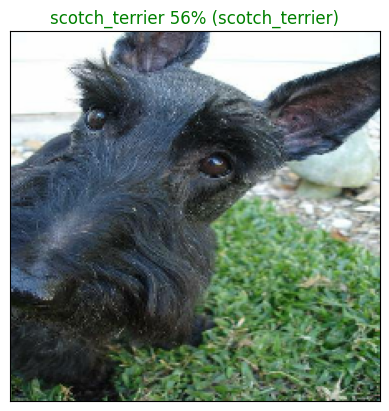

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_lables,images=val_images)

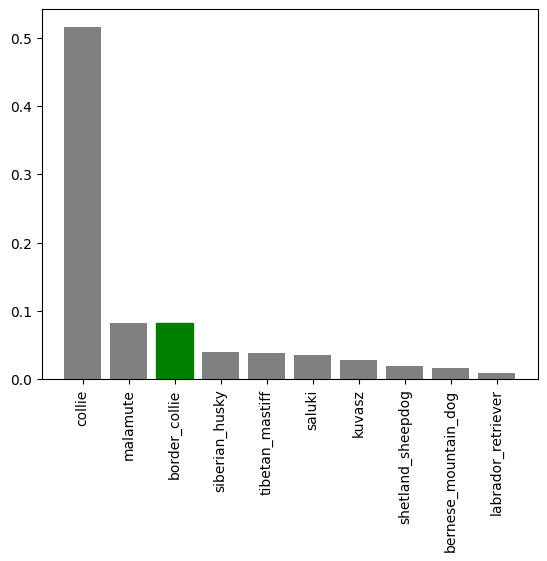

In [ ]:
#plot top 10 predictions of a one dog prediction

def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  pred_label=get_pred_label(pred_prob)
  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_lables=unique_breeds[top_10_pred_indexes]

  top_plot=plt.bar(np.arange(len(top_10_pred_lables)),top_10_pred_values,color="grey")
  plt.xticks(np.arange(len(top_10_pred_lables)),labels=top_10_pred_lables, rotation="vertical")

  if np.isin(true_label,top_10_pred_lables):
    top_plot[np.argmax(top_10_pred_lables==true_label)].set_color("green")
  else:
    pass

plot_pred_conf(prediction_probabilities=predictions, labels=val_lables,n=9)

In [ ]:
# pred_prob.argsort()[-10:][::-1]

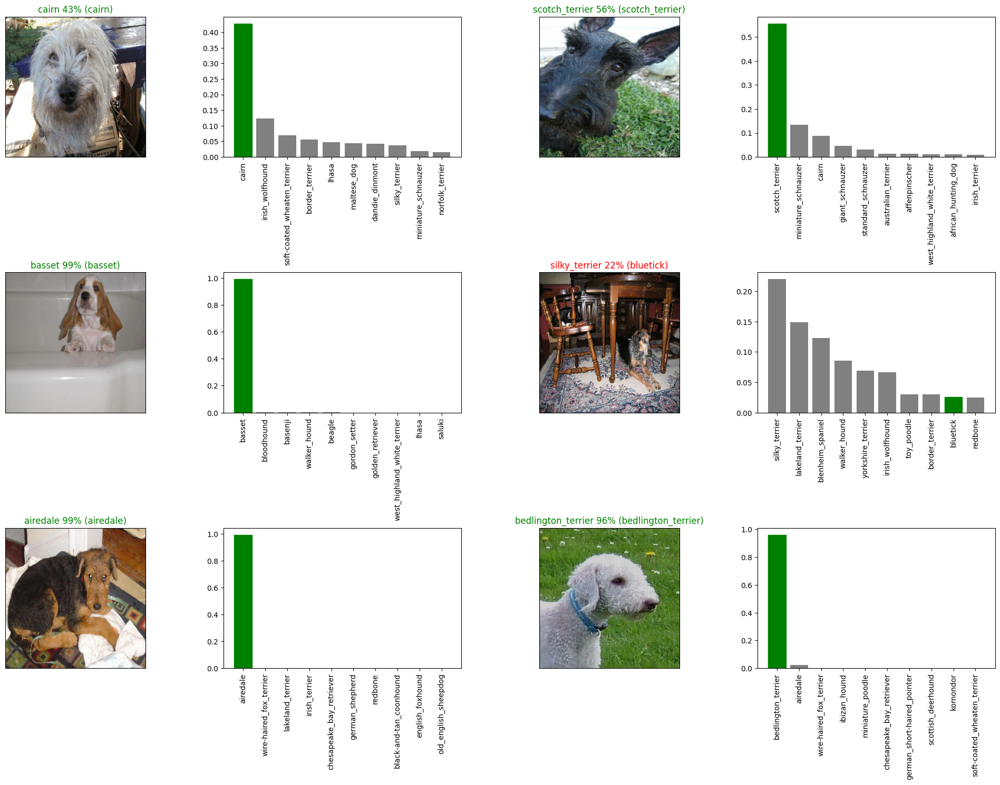

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_lables,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_lables,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and loading model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20240425-15391714059596-1000-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240425-15391714059596-1000-images-Adam.h5'

In [ ]:
# Load our model trained on images
model_1000_images = load_model('drive/MyDrive/Dog Vision/models/20240425-15391714059596-1000-images-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20240425-15391714059596-1000-images-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 2s 241ms/step - loss: 1.2640 - accuracy: 0.6350


[1.263951063156128, 0.6349999904632568]

In [ ]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 5s 327ms/step - loss: 1.2640 - accuracy: 0.6350


[1.263951063156128, 0.6349999904632568]

### Training With full Data set